In [1]:
import pandas as pd
import numpy as np
import cv2
import os
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer as CV

In [2]:
train_path = '/kaggle/input/shopee-product-matching/train_images/'
test_path = '/kaggle/input/shopee-product-matching/test_images/'

train_df = pd.read_csv('/kaggle/input/shopee-product-matching/train.csv')
test_df = pd.read_csv('/kaggle/input/shopee-product-matching/test.csv')

In [3]:
def basic_info(df, mode):
    
    print(f'============================ {mode} ==============================\n')
    display(df.head())
    print(f'Shape = {df.shape}')
    print(f'Columns = {df.columns}')

basic_info(train_df, 'Train')

============================ Train ==============================



,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


Shape = (34250, 5)
Columns = Index(['posting_id', 'image', 'image_phash', 'title', 'label_group'], dtype='object')


In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.3+ MB


/tmp/ipykernel_33/272590030.py:2: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  graph = sns.displot(data=train_df.isna().melt(value_name='missing'), y= 'variable', hue='missing',
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of p

<Figure size 1200x1400 with 0 Axes>

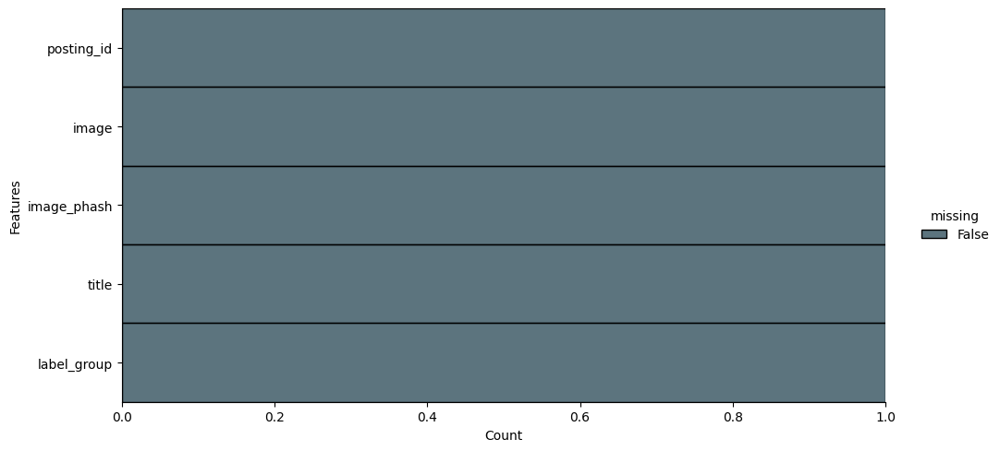

In [5]:
plt.figure(figsize=(12, 14))
graph = sns.displot(data=train_df.isna().melt(value_name='missing'), y= 'variable', hue='missing', 
                                      aspect=2.0, multiple='fill', palette=['#264653', '#2a9d8f'])
graph.set(ylabel='Features')

In [6]:
train_df.apply(pd.Series.nunique, axis=0)

posting_id     34250
image          32412
image_phash    28735
title          33117
label_group    11014
dtype: int64

In [7]:
import glob
def getImagePaths(path):
    images_path = []
    filenames = glob.glob(path+'*.jpg')
    for filename in filenames:
        images_path.append(filename)
    
    return images_path
train_images_path = getImagePaths(train_path)
test_images_path = getImagePaths(test_path)

In [8]:
train_images_path[0:3]

['/kaggle/input/shopee-product-matching/train_images/07c251a26b8266c85730ab8d870f1356.jpg',
 '/kaggle/input/shopee-product-matching/train_images/36dc46d97cdaa7622793e7016976da46.jpg',
 '/kaggle/input/shopee-product-matching/train_images/b3c7b96aeb0398b152fa5984260a6c57.jpg']

In [9]:
def CheckImageShape(image_path):
    temp_img = cv2.imread(image_path[0]).shape
    for img in image_path:
        img = cv2.imread(img).shape
        if temp_img == img:
            return "Same Image Shape" + str(temp_img)
        else:
            return "Different Image Shape"

In [10]:
CheckImageShape(train_images_path)

'Same Image Shape(640, 640, 3)'

In [11]:
CheckImageShape(test_images_path)

'Same Image Shape(1000, 1000, 3)'

In [12]:
def Show_Images(images_paths, rows, cols, title):
    
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(16, 8))
    fig.suptitle(title, fontsize=20)
    
    for ind, img_path in enumerate(images_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        try:
            ax.ravel()[ind].imshow(img)
            ax.ravel()[ind].set_axis_off()
        except:
            continue
            
    plt.tight_layout()
    plt.show()

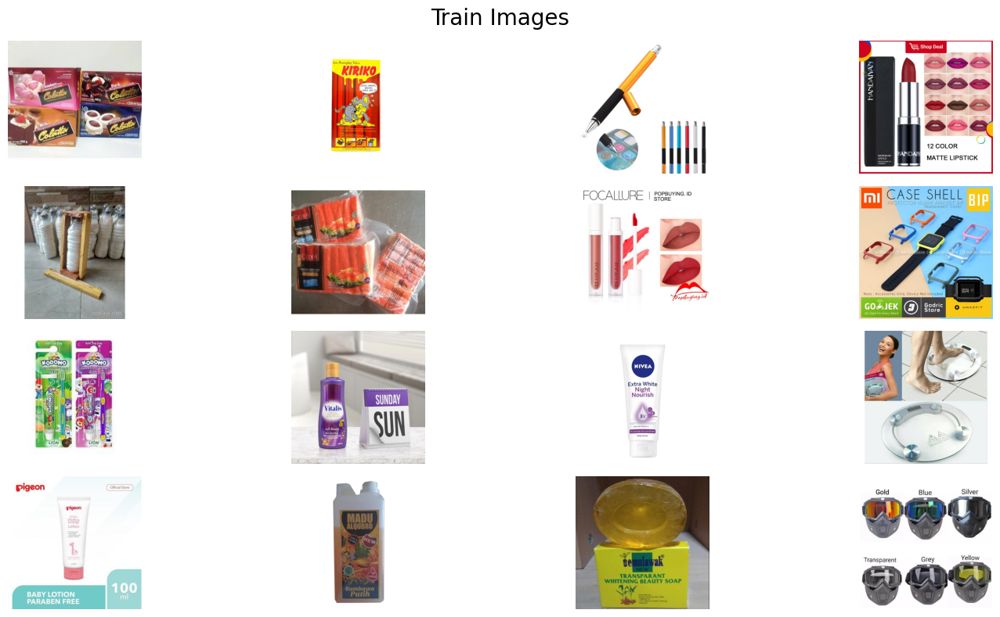

In [13]:
Show_Images(train_images_path[0:16], 4, 4, 'Train Images')

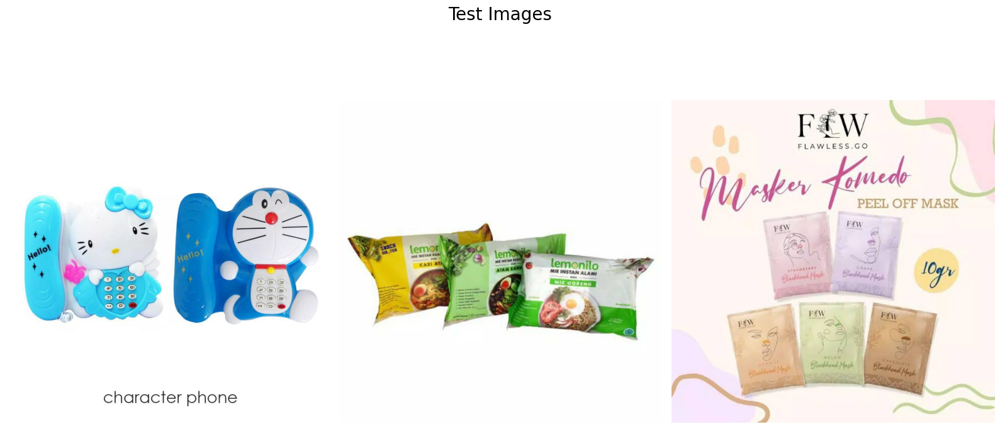

In [14]:
Show_Images(test_images_path, 1, 3, 'Test Images')

,label_group,count
0,994676122,51
1,1163569239,51
2,1141798720,51


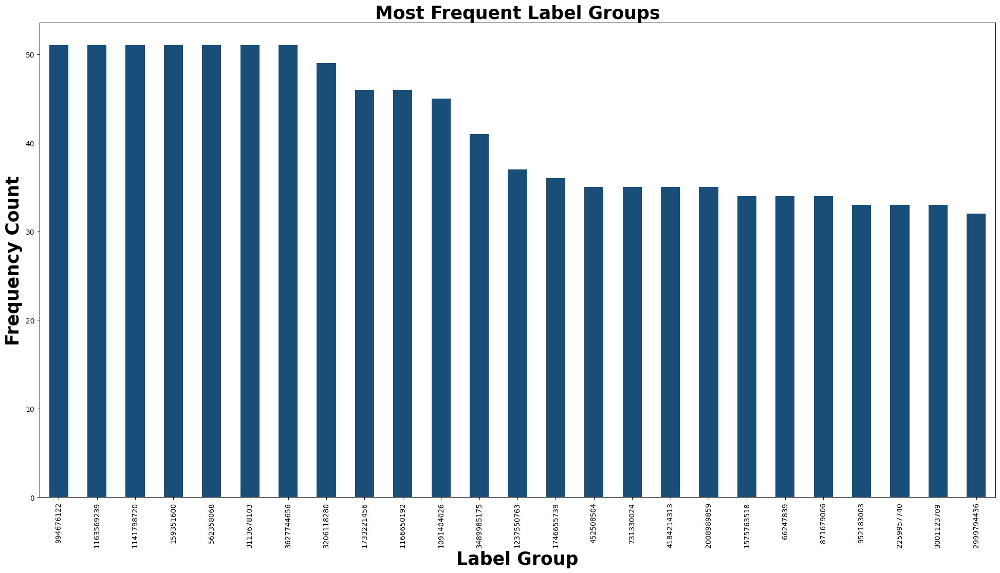

In [15]:
train_label_count = train_df['label_group'].value_counts()[:25]
plt.figure(figsize=(24, 12))
train_label_count.plot(kind='bar',color = ['#184e77'])
plt.title('Most Frequent Label Groups', size=25,weight='bold')
plt.xlabel("Label Group",size=25,weight='bold')
plt.ylabel("Frequency Count", size=25, weight='bold')

most_frq = pd.DataFrame(train_label_count).reset_index()
most_frq.head(3)

,label_group,count
0,1090963197,2
1,947345678,2
2,461879787,2
3,1328017795,2
4,2594100216,2
5,1037582168,2
6,3287544582,2
7,2796307242,2
8,3435627865,2
9,792405760,2


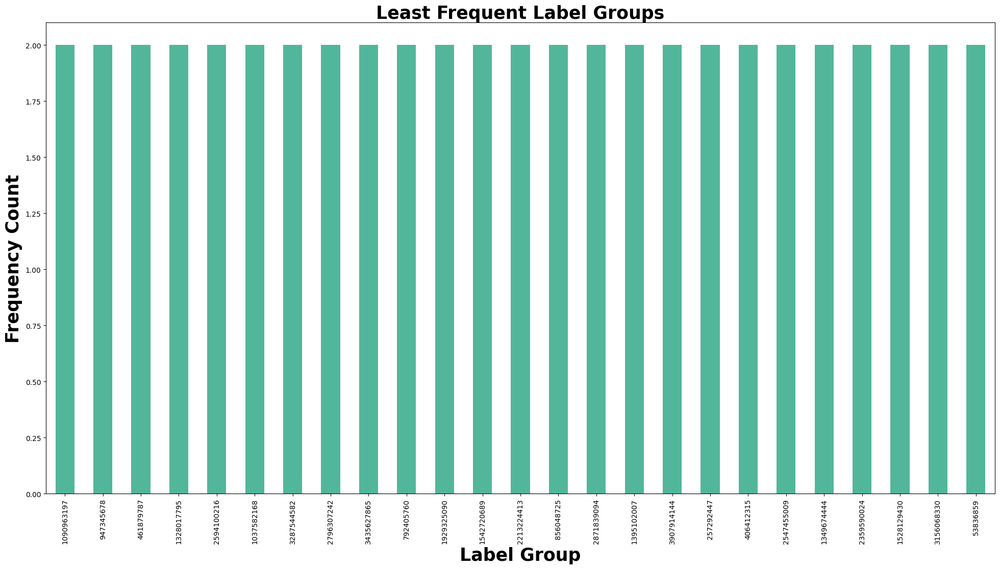

In [16]:
train_label_count = train_df['label_group'].value_counts()[-25:]
plt.figure(figsize=(24, 12))
train_label_count.plot(kind='bar',color = ['#52b69a'])
plt.title('Least Frequent Label Groups', size=25,weight='bold')
plt.xlabel("Label Group",size=25,weight='bold')
plt.ylabel("Frequency Count", size=25, weight='bold')

least_frq = pd.DataFrame(train_label_count).reset_index()
least_frq.head(10)

In [17]:
def path(name, temp):
    
    if temp == 'l':
        data = train_df['image'][train_df['label_group'] == name].values
    
    if temp == 't':
        data = train_df['image'][train_df['title'] == name].values
        
    
    image_paths = []
    for filename in data:
        full_path = os.path.join(train_path, filename)
        image_paths.append(full_path)
    
    return image_paths
    

## Most Frequent Labels

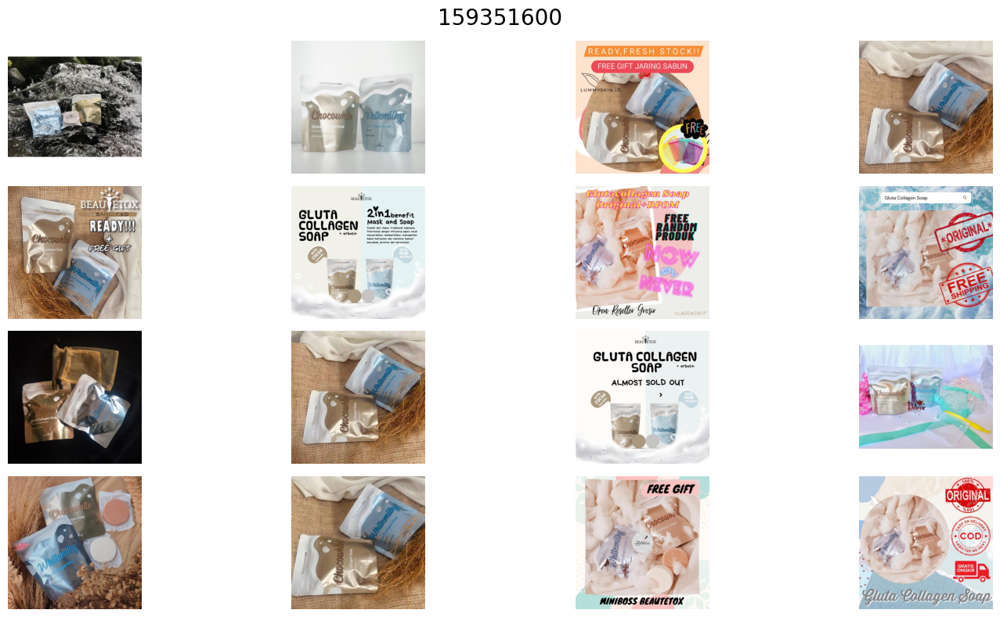

In [18]:
lg = 159351600
Show_Images(path(lg, 'l'), 4, 4, lg)

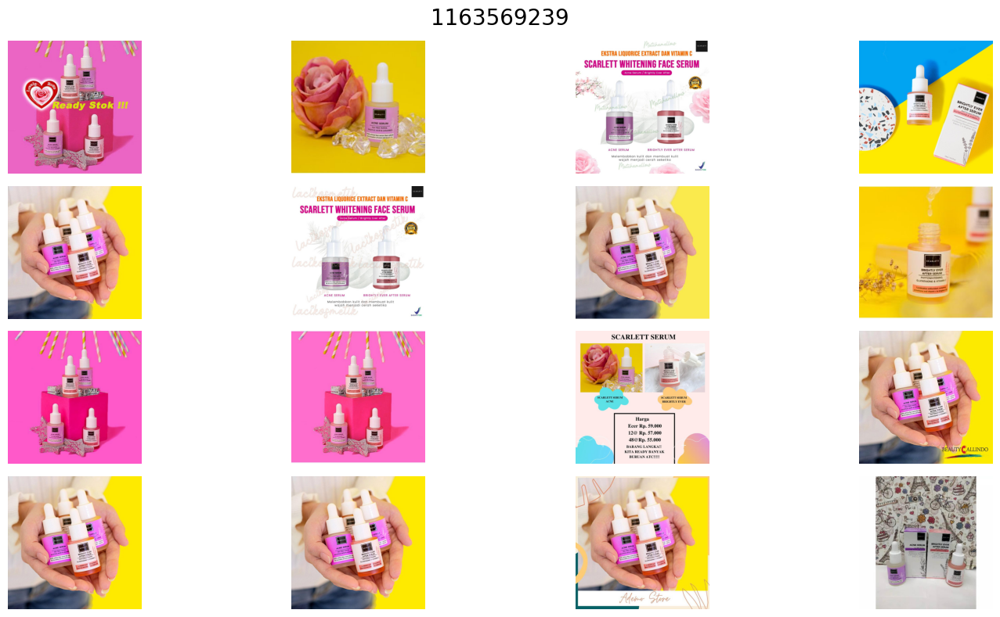

In [19]:
lg = 1163569239
Show_Images(path(lg, 'l'), 4, 4, lg)

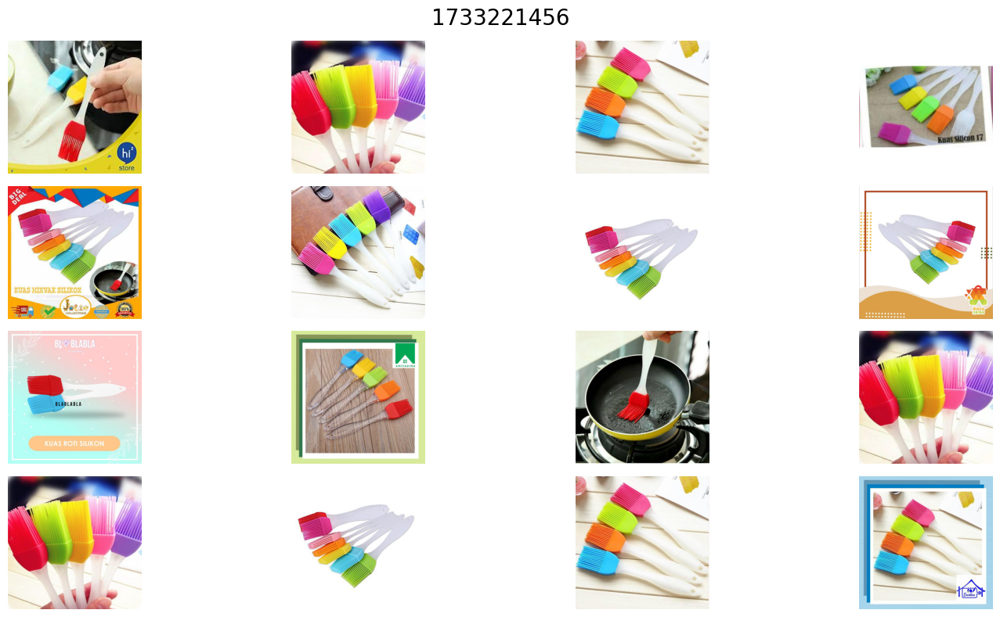

In [20]:
lg = 1733221456
Show_Images(path(lg, 'l'), 4, 4, lg)

## Least Frequent Labels

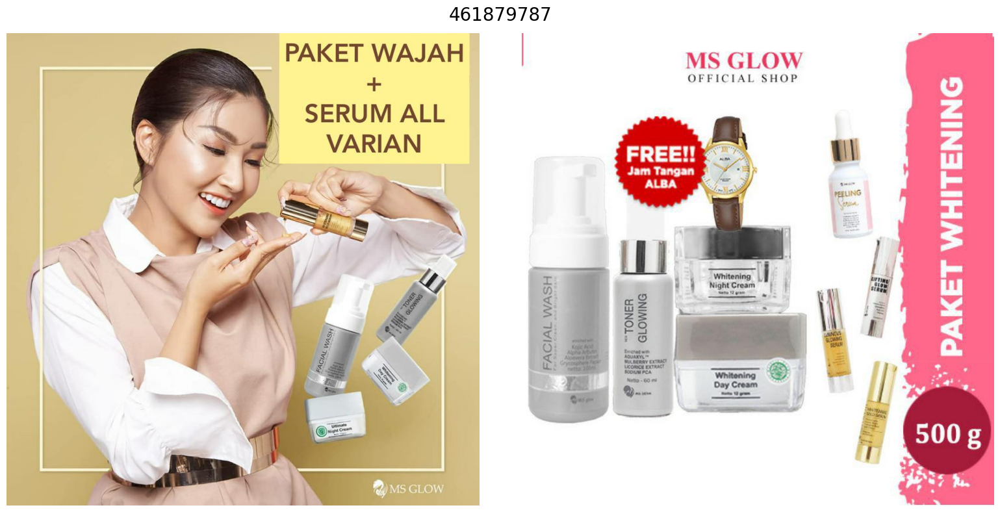

In [21]:
lg = 461879787
Show_Images(path(lg, 'l'), 1, 2, lg)

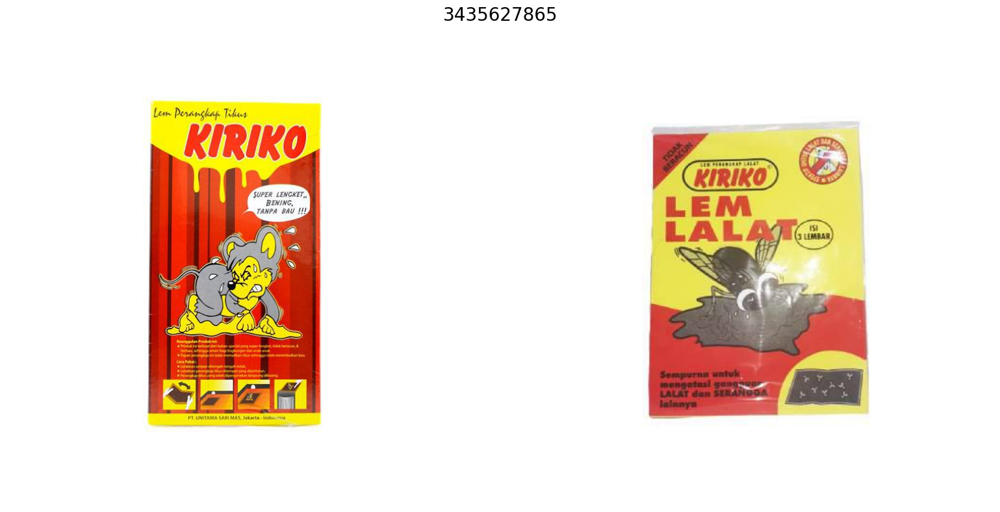

In [22]:
lg = 3435627865
Show_Images(path(lg, 'l'), 1, 2, lg)

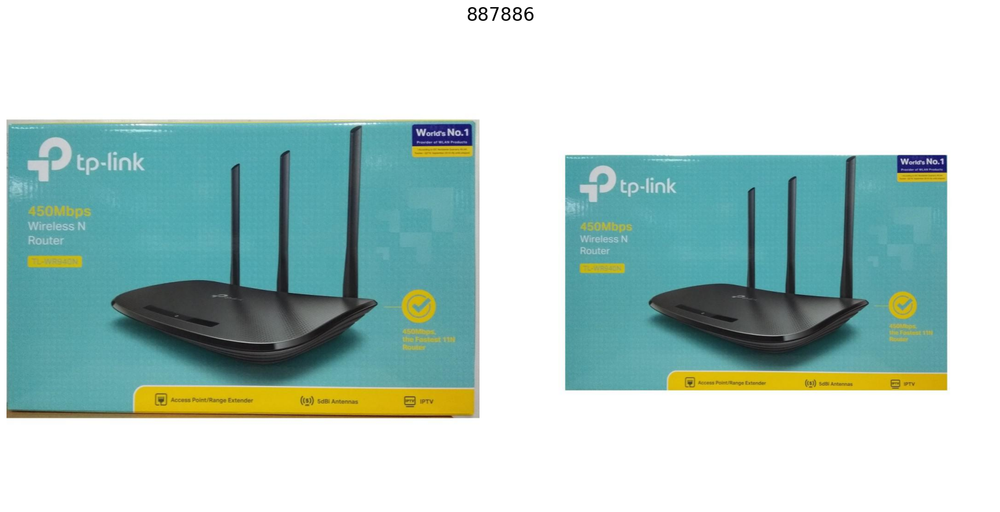

In [23]:
lg = 887886
Show_Images(path(lg, 'l'), 1, 2, lg)

In [24]:
most_to_least_titles = train_df['title'].value_counts().sort_values(ascending=False).reset_index()
most_to_least_titles.columns = ['title', 'frequency_count']
most_to_least_titles

,title,frequency_count
0,Koko syubbanul muslimin koko azzahir koko baju,9
1,Baju Koko Pria Gus Azmi Syubbanul Muslimin Kom...,8
2,Viva Air Mawar,6
3,Monde Boromon Cookies 1 tahun+ 120gr,6
4,100 Pcs Ikat Rambut Karet Polos Elastis Gaya K...,6
...,...,...
33112,HelloMaster - 665 - Tas Handbag Wanita KOREA F...,1
33113,"Holder Hp , Mobil & Rumah Magic Suction 360 D...",1
33114,KARDUS PACKING,1
33115,SANDAL WEDGES SPON KN 02 SILANG,1


## Most Frequent Title:

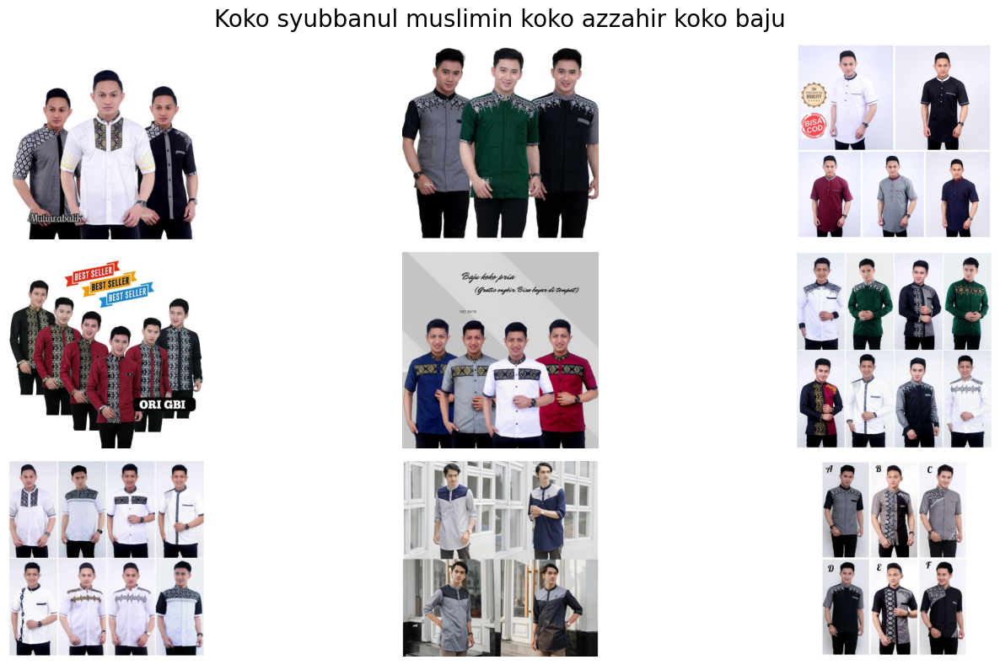

In [25]:
t = most_to_least_titles.loc[0, 'title']
Show_Images(path(t, 't'), 3, 3, t)

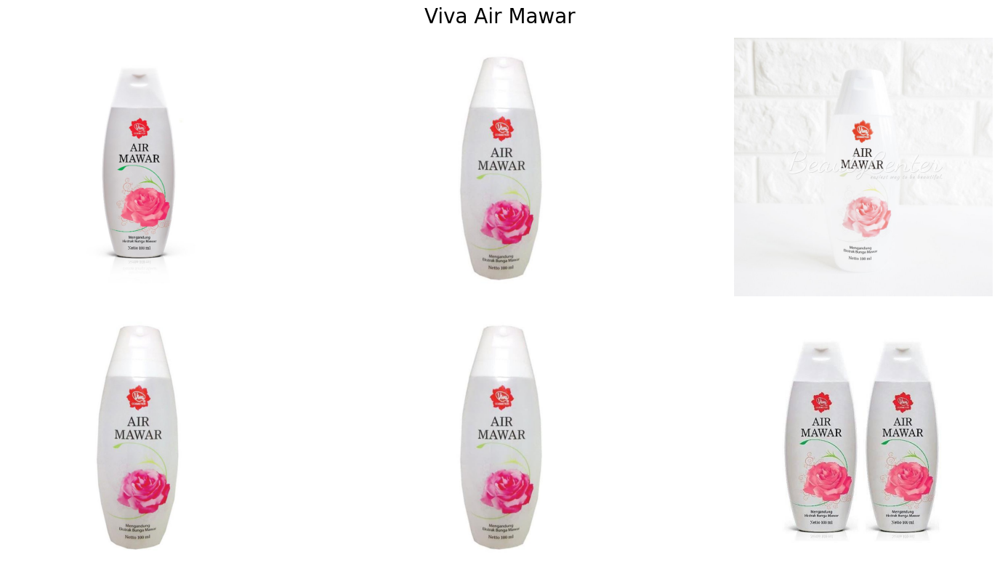

In [26]:
t = most_to_least_titles.loc[2, 'title']
Show_Images(path(t, 't'), 2, 3, t)

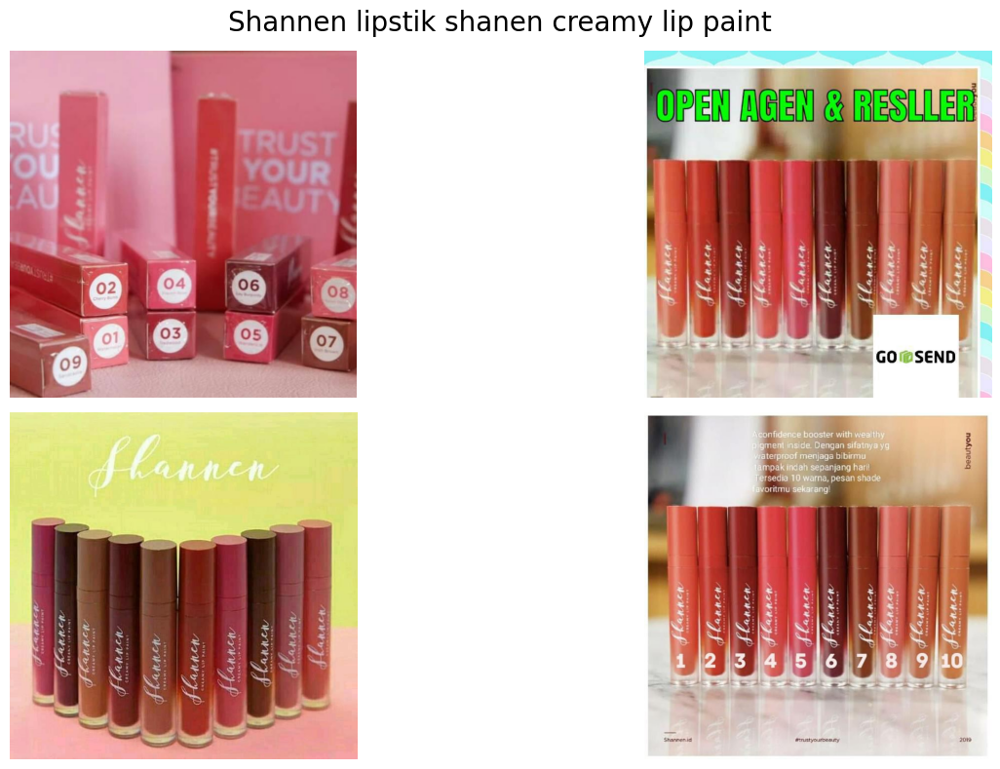

In [27]:
t = most_to_least_titles.loc[6, 'title']
Show_Images(path(t, 't'), 2, 2, t)

In [28]:
def get_top_n_words(corpus, n=None):
    vec = CV().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_of_words = bag_of_words.sum(axis=0)
    word_freq = [(word, sum_of_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    word_freq = sorted(word_freq, key=lambda x: x[1], reverse=True)
    return word_freq[:n]

def get_top_n_bigrams(corpus, n=None):
    vec = CV(ngram_range=(2,2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_of_words = bag_of_words.sum(axis=0)
    word_freq = [(word, sum_of_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    word_freq = sorted(word_freq, key=lambda x: x[1], reverse=True)
    return word_freq[:n]

def get_top_n_trigrams(corpus, n=None):
    vec = CV(ngram_range=(3,3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_of_words = bag_of_words.sum(axis=0)
    word_freq = [(word, sum_of_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    word_freq = sorted(word_freq, key=lambda x: x[1], reverse=True)
    return word_freq[:n]

In [29]:
def plot(x, w, p):
    common_words = x(train_df['title'], 20)
    common_words_df = pd.DataFrame(common_words, columns=['word', 'freq'])
    
    plt.figure(figsize=(16, 8))
    sns.barplot(x='freq',y='word', data=common_words_df, palette=p)
    plt.title('Top 20 ' + w, fontsize=16)
    plt.xlabel('Frequency', fontsize=14)
    plt.yticks(fontsize=13)
    plt.xticks(rotation=45, fontsize=13)
    plt.ylabel("")
    
    return common_words_df

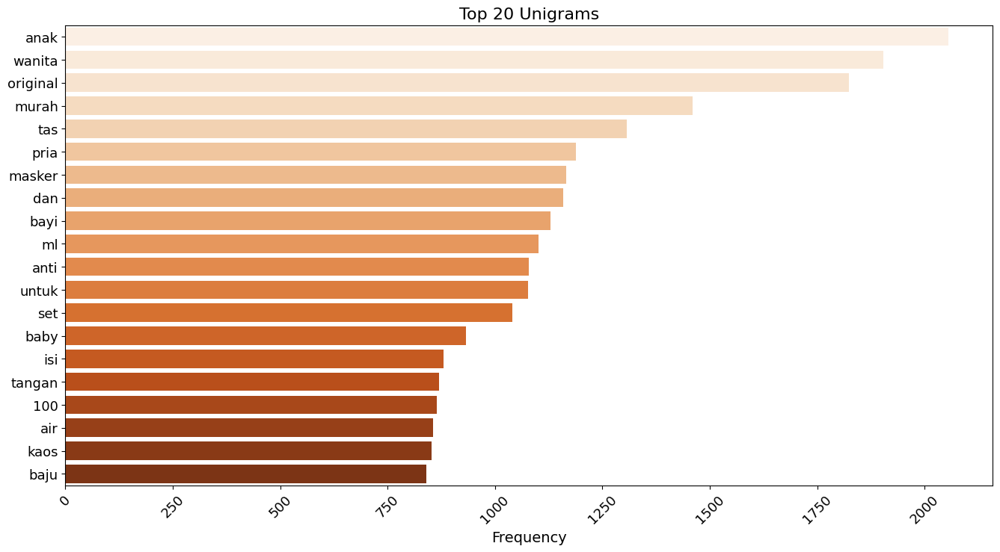

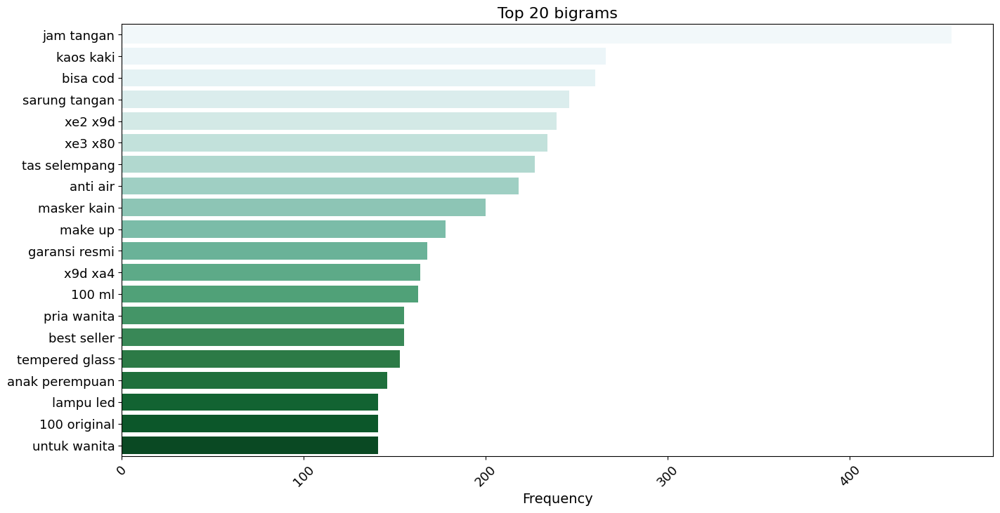

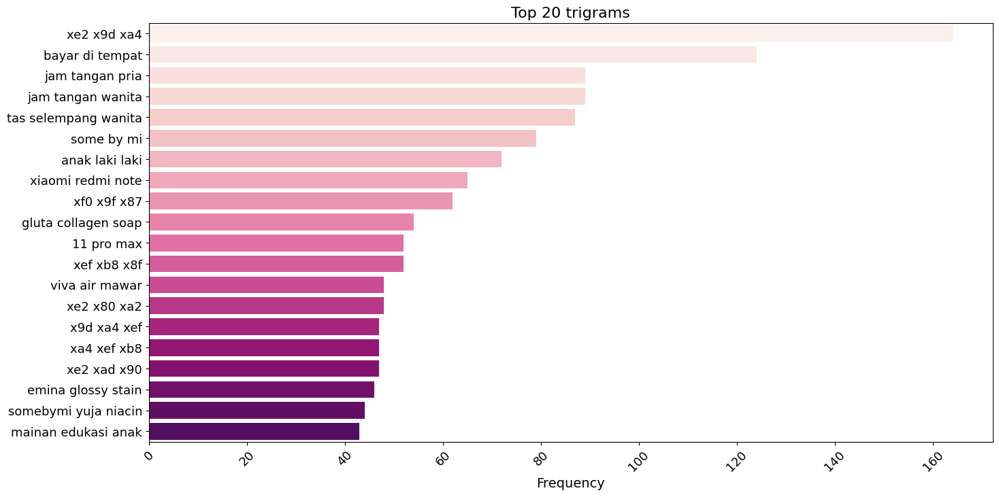

In [30]:
common_words = get_top_n_words(train_df['title'], 20)
common_words_df1 = pd.DataFrame(common_words, columns = ['word', 'freq'])

plt.figure(figsize=(16, 8))
sns.barplot(x='freq', y='word', data=common_words_df1, palette='Oranges')
plt.title('Top 20 Unigrams', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.ylabel("")

common_words_df2 = plot(get_top_n_bigrams, 'bigrams', 'BuGn')
common_words_df3 = plot(get_top_n_trigrams, 'trigrams', 'RdPu')

## Key Points:

* It seems we have duplicate products
* we have some products labels which got repeated 30+ times 
* we have some products title which got repeated 6+ times


#### Now we explore how we gonna make a suitable model for this dataset:

* we have to find the matching products.
* two images can show the same product or maybe different ones, so retail companies 
  careful about this and want to avoid misrepresentation and other issues.
* we design a Machine Learning Model which resolves this matching problem and will
  find matching products as much accurately as it can.
  